# GLIMPSE1 imputation accuracy

In [3]:
include("/u/home/b/biona001/bge_analysis/concordance/scripts/utilities.jl")
include("/u/home/b/biona001/bge_analysis/concordance/scripts/plots.jl")

global ancestry_r2_exe = "/u/home/b/biona001/bge_analysis/concordance/scripts/local_ancestry_r2.jl"
global concordance_exe = "/u/home/b/biona001/bge_analysis/concordance/scripts/concordance.jl"
global aggregate_r2_exe = "/u/home/b/biona001/bge_analysis/concordance/scripts/aggregate_r2.jl"

# helper function to submit 1 job to run a given command
function submit(command::String, ncores::Int, total_mem::Number; jobname="submit", waitfor=String[])
    mem = round(Int, total_mem / ncores) # memory per core
    filename = joinpath("/u/scratch/b/biona001", "$jobname.sh")
    open(filename, "w") do io
        println(io, "#!/bin/bash")
        println(io, "#\$ -cwd")
        println(io, "# error = Merged with joblog")
        println(io, "#\$ -o /u/home/b/biona001/project-loes/joblogs/joblog.\$JOB_ID")
        println(io, "#\$ -j y")
        println(io, "#\$ -l h_rt=24:00:00,h_data=$(mem)G,arch=intel*")
        println(io, "#\$ -pe shared $ncores")
        println(io, "# Email address to notify")
        println(io, "## \$ -M \$USER@mal")
        println(io, "# Notify when:")
        println(io, "#\$ -m bea")
        println(io, "")
        println(io, "#save job info on joblog:")
        println(io, "echo \"Job \$JOB_ID started on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID started on:   \" `date `")
        println(io, "")
        println(io, "# load the job environment:")
        println(io, ". /u/local/Modules/default/init/modules.sh")
        println(io, "module load plink")
        println(io, "module load vcftools")
        println(io, "module load julia/1.9")
        println(io, "")
        println(io, "echo \"$command\"")
        println(io, "$command")
        println(io, "")
        println(io, "#echo job info on joblog:")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `date `")
        println(io, "#echo \" \"")
    end
    # submit job
    if length(waitfor) != 0
        run(`qsub -hold_jid $(join(waitfor, ',')) -N $jobname $filename`)
    else
        run(`qsub -N $jobname $filename`)
    end
    rm(filename, force=true)
end

# helper function to submit 1 job to run multiple commands
function submit(commands::Vector{String}, ncores::Int, total_mem::Number; jobname="submit", waitfor=String[])
    mem = round(Int, total_mem / ncores) # memory per core
    filename = joinpath("/u/scratch/b/biona001", "$jobname.sh")
    open(filename, "w") do io
        println(io, "#!/bin/bash")
        println(io, "#\$ -cwd")
        println(io, "# error = Merged with joblog")
        println(io, "#\$ -o /u/home/b/biona001/project-loes/joblogs/joblog.\$JOB_ID")
        println(io, "#\$ -j y")
        println(io, "#\$ -l h_rt=24:00:00,h_data=$(mem)G,arch=intel*")
        println(io, "#\$ -pe shared $ncores")
        println(io, "# Email address to notify")
        println(io, "## \$ -M \$USER@mal")
        println(io, "# Notify when:")
        println(io, "#\$ -m bea")
        println(io, "")
        println(io, "#save job info on joblog:")
        println(io, "echo \"Job \$JOB_ID started on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID started on:   \" `date `")
        println(io, "")
        println(io, "# load the job environment:")
        println(io, ". /u/local/Modules/default/init/modules.sh")
        println(io, "module load plink")
        println(io, "module load vcftools")
        println(io, "module load julia/1.9")
        println(io, "")
        for command in commands
            println(io, "echo \"$command\"")
            println(io, "$command")
        end
        println(io, "")
        println(io, "#echo job info on joblog:")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `hostname -s`")
        println(io, "echo \"Job \$JOB_ID ended on:   \" `date `")
        println(io, "#echo \" \"")
    end
    # submit job
    if length(waitfor) != 0
        run(`qsub -hold_jid $(join(waitfor, ',')) -N $jobname $filename`)
    else
        run(`qsub -N $jobname $filename`)
    end
    rm(filename, force=true)
end

submit (generic function with 2 methods)

## Compute aggregate R2

We compute aggregate R2s based on 2 sets of genotype data:
+ Basic QC: only applied basic MAF and HWE filtering to array genotype data
+ Non-basic QC: also ran Beagle 5's `conform_gt` program on the array genotype data. 

In [9]:
use_QC_imputed_data = false
paisa_dir = use_QC_imputed_data ? 
    "/u/home/b/biona001/project-loes/paisa_qc_v1" : 
    "/u/home/b/biona001/project-loes/paisa_tmp"

for basic_QC in [true, false]
    # directories
    dosage_dir = joinpath(paisa_dir, "genotype_dosages")
    array_dir = basic_QC ? 
        "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC" : 
        "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed"
    outdir = joinpath(paisa_dir, "accuracy")

    # chromosome by chromosome
    for chr in 1:22
        genofile = joinpath(array_dir, "chr$chr.vcf.gz")
        imputed_file = joinpath(dosage_dir, "chr$chr.vcf.gz")
        outfile = joinpath(outdir, basic_QC ? "chr$chr.basicQC.r2" : "chr$chr.r2")
        cmd = "julia $aggregate_r2_exe --truth $genofile --impt $imputed_file --out $outfile"
        submit(cmd, 1, 12, jobname="chr$chr.r2", waitfor=["filt_geno$chr"])
    end

    # also compute over all chromosomes
    genotype_files = String[]
    imputed_files = String[]
    for chr in 1:22
        push!(genotype_files, joinpath(array_dir, "chr$chr.vcf.gz"))
        push!(imputed_files, joinpath(dosage_dir, "chr$chr.vcf.gz"))
    end
    input1 = joinpath(outdir, basic_QC ? "chr1to22_basic_array_files.txt" : "chr1to22_array_files.txt")
    input2 = joinpath(outdir, basic_QC ? "chr1to22_basic_imputed_files.txt" : "chr1to22_imputed_files.txt")
    writedlm(input1, genotype_files)
    writedlm(input2, imputed_files)
    outfile = joinpath(outdir, basic_QC ? "allchr.basicQC.r2" : "allchr.r2")
    cmd = "julia $aggregate_r2_exe --truth $input1 --impt $input2 --out $outfile"
    submit(cmd, 1, 12, jobname="chr1-22.r2", waitfor=["filt_geno$chr" for chr in 1:22])
end

Your job 855449 ("chr1.r2") has been submitted
Your job 855450 ("chr2.r2") has been submitted
Your job 855451 ("chr3.r2") has been submitted
Your job 855452 ("chr4.r2") has been submitted
Your job 855453 ("chr5.r2") has been submitted
Your job 855454 ("chr6.r2") has been submitted
Your job 855455 ("chr7.r2") has been submitted
Your job 855456 ("chr8.r2") has been submitted
Your job 855457 ("chr9.r2") has been submitted
Your job 855458 ("chr10.r2") has been submitted
Your job 855459 ("chr11.r2") has been submitted
Your job 855460 ("chr12.r2") has been submitted
Your job 855461 ("chr13.r2") has been submitted
Your job 855462 ("chr14.r2") has been submitted
Your job 855463 ("chr15.r2") has been submitted
Your job 855464 ("chr16.r2") has been submitted
Your job 855465 ("chr17.r2") has been submitted
Your job 855467 ("chr18.r2") has been submitted
Your job 855468 ("chr19.r2") has been submitted
Your job 855469 ("chr20.r2") has been submitted
Your job 855470 ("chr21.r2") has been submitted
Y

## Aggregate R2 plot

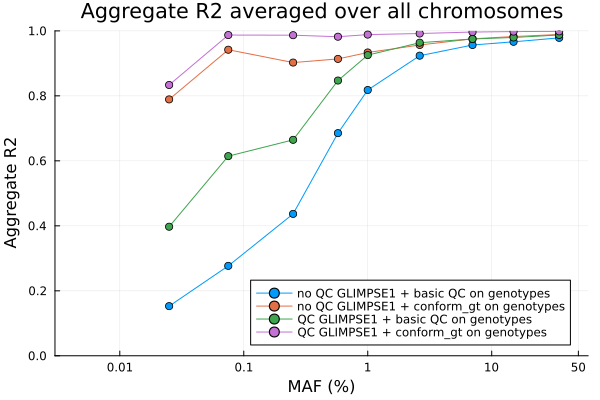

In [8]:
maf_bins = [0.0, 0.0005, 0.00100, 0.00400, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5]
plt_labels = [
    "no QC GLIMPSE1 + basic QC on genotypes", 
    "no QC GLIMPSE1 + conform_gt on genotypes",
    "QC GLIMPSE1 + basic QC on genotypes", 
    "QC GLIMPSE1 + conform_gt on genotypes"
]

noQC_basic = CSV.read("/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.basicQC.r2", DataFrame)[:, 2]
noQC_aggresive = CSV.read("/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.r2", DataFrame)[:, 2]
QC_basic = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.basicQC.r2", DataFrame)[:, 2]
QC_aggresive = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.r2", DataFrame)[:, 2]

title = "Aggregate R2 averaged over all chromosomes"
plt = make_aggregate_R2_plots(
    [noQC_basic, noQC_aggresive, QC_basic, QC_aggresive], 
    plt_labels, maf_bins, title
)

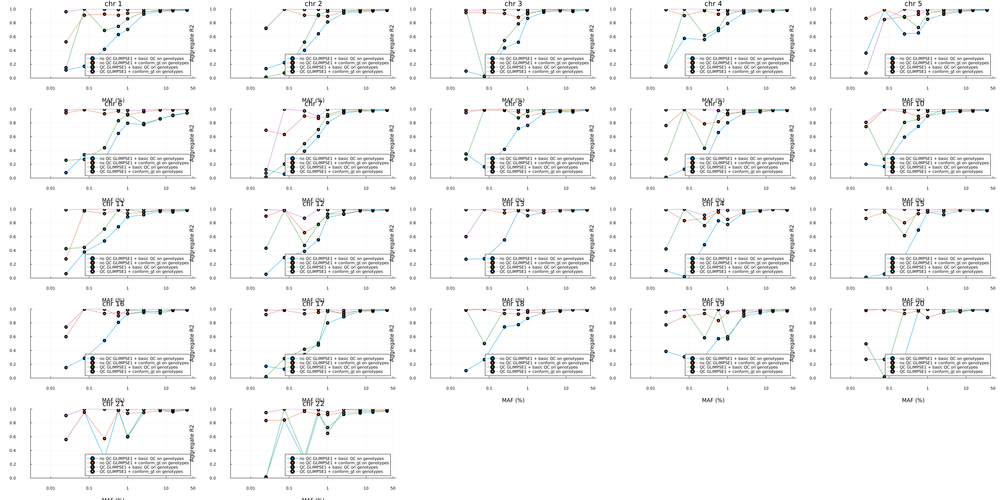

In [2]:
maf_bins = [0.0, 0.0005, 0.00100, 0.004, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5]

plts = []
for chr in 1:22
    # read 4 results
    noqc_r2_basic = CSV.read("/u/home/b/biona001/project-loes/paisa_tmp/accuracy/chr$chr.basicQC.r2", DataFrame)[:, 2]
    no_qc_r2 = CSV.read("/u/home/b/biona001/project-loes/paisa_tmp/accuracy/chr$chr.r2", DataFrame)[:, 2]
    qc_r2_basic = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/chr$chr.basicQC.r2", DataFrame)[:, 2]
    qc_r2 = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/chr$chr.r2", DataFrame)[:, 2]
    
    # make plots
    plt_labels = [
        "no QC GLIMPSE1 + basic QC on genotypes", 
        "no QC GLIMPSE1 + conform_gt on genotypes",
        "QC GLIMPSE1 + basic QC on genotypes", 
        "QC GLIMPSE1 + conform_gt on genotypes"
    ]
    title = "chr $chr"
    plt = make_aggregate_R2_plots(
        [noqc_r2_basic, no_qc_r2, qc_r2_basic, qc_r2], plt_labels, maf_bins, title
    )
    
    # save plot
    push!(plts, plt)
end

plot(plts..., 
    size=(3000, 1500), dpi=300, left_margin=5Plots.mm, bottom_margin=5Plots.mm
)

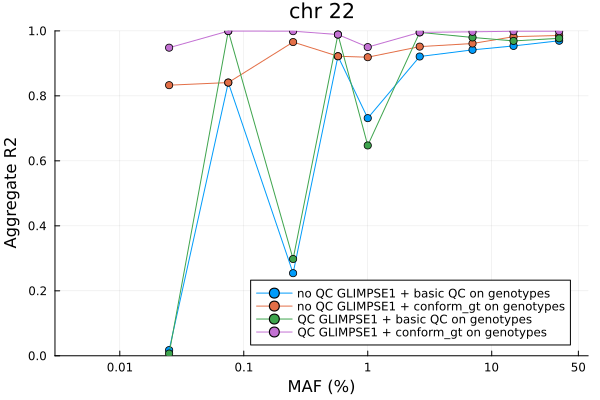

In [6]:
plot(plts[end])

## Compute aggregate R2 by local ancestry

In [4]:
basic_QC = false # must be false!! Since to do phasing we must run conform_gt

# chromosome by chromosome
for chr in 1:22
    genotype_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
    imputed_file = "/u/home/b/biona001/project-loes/paisa_tmp/genotype_dosages/chr$chr.vcf.gz"
    msp_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/LAI/output/chr$chr.msp.tsv"
    outfile = "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/chr$chr.ancestryR2"
    cmd = "julia $ancestry_r2_exe --truth $genotype_file --impt $imputed_file --msp $msp_file --out $outfile"
    submit(cmd, 1, 12, jobname="chr$(chr)ansR2")
end

# also compute over all chromosomes
genotype_files = String[]
imputed_files = String[]
msp_files = String[]
for chr in 1:22
    chr == 10 && continue
    genotype_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
    imputed_file = "/u/home/b/biona001/project-loes/paisa_tmp/genotype_dosages/chr$chr.vcf.gz"
    msp_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/LAI/output/chr$chr.msp.tsv"
    push!(genotype_files, genotype_file)
    push!(imputed_files, imputed_file)
    push!(msp_files, msp_file)
end
outdir = "/u/home/b/biona001/project-loes/paisa_tmp/accuracy"
input1 = joinpath(outdir, "chr1to22_array_files.txt")
input2 = joinpath(outdir, "chr1to22_imputed_files.txt")
input3 = joinpath(outdir, "chr1to22_msp_files.txt")
writedlm(input1, genotype_files)
writedlm(input2, imputed_files)
writedlm(input3, msp_files)
outfile = joinpath(outdir, "allchr.ancestryR2")
cmd = "julia $ancestry_r2_exe --truth $input1 --impt $input2 --msp $input3 --out $outfile"
submit(cmd, 1, 12, jobname="chr1-22.ansR2")

Your job 859343 ("chr1ansR2") has been submitted
Your job 859344 ("chr2ansR2") has been submitted
Your job 859345 ("chr3ansR2") has been submitted
Your job 859346 ("chr4ansR2") has been submitted
Your job 859347 ("chr5ansR2") has been submitted
Your job 859348 ("chr6ansR2") has been submitted
Your job 859349 ("chr7ansR2") has been submitted
Your job 859350 ("chr8ansR2") has been submitted
Your job 859351 ("chr9ansR2") has been submitted
Your job 859352 ("chr10ansR2") has been submitted
Your job 859353 ("chr11ansR2") has been submitted
Your job 859354 ("chr12ansR2") has been submitted
Your job 859355 ("chr13ansR2") has been submitted
Your job 859356 ("chr14ansR2") has been submitted
Your job 859357 ("chr15ansR2") has been submitted
Your job 859358 ("chr16ansR2") has been submitted
Your job 859359 ("chr17ansR2") has been submitted
Your job 859360 ("chr18ansR2") has been submitted
Your job 859361 ("chr19ansR2") has been submitted
Your job 859362 ("chr20ansR2") has been submitted
Your job 

In [4]:
# also compute over all chromosomes
genotype_files = String[]
imputed_files = String[]
msp_files = String[]
for chr in 1:22
    chr == 10 && continue
    genotype_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
    imputed_file = "/u/home/b/biona001/project-loes/paisa_tmp/genotype_dosages/chr$chr.vcf.gz"
    msp_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/LAI/output/chr$chr.msp.tsv"
    push!(genotype_files, genotype_file)
    push!(imputed_files, imputed_file)
    push!(msp_files, msp_file)
end
outdir = "/u/home/b/biona001/project-loes/paisa_tmp/accuracy"
input1 = joinpath(outdir, "chr1to22_array_files.txt")
input2 = joinpath(outdir, "chr1to22_imputed_files.txt")
input3 = joinpath(outdir, "chr1to22_msp_files.txt")
writedlm(input1, genotype_files)
writedlm(input2, imputed_files)
writedlm(input3, msp_files)
outfile = joinpath(outdir, "allchr.ancestryR2")
cmd = "julia $ancestry_r2_exe --truth $input1 --impt $input2 --msp $input3 --out $outfile"
submit(cmd, 1, 12, jobname="chr1-22.ansR2")

Your job 862914 ("chr1-22.ansR2") has been submitted


In [5]:
# also compute over all chromosomes
genotype_files = String[]
imputed_files = String[]
msp_files = String[]
for chr in 1:22
    chr == 10 && continue
    genotype_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
    imputed_file = "/u/home/b/biona001/project-loes/paisa_qc_v1/genotype_dosages/chr$chr.vcf.gz"
    msp_file = "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/LAI/output/chr$chr.msp.tsv"
    push!(genotype_files, genotype_file)
    push!(imputed_files, imputed_file)
    push!(msp_files, msp_file)
end
outdir = "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy"
input1 = joinpath(outdir, "chr1to22_array_files.txt")
input2 = joinpath(outdir, "chr1to22_imputed_files.txt")
input3 = joinpath(outdir, "chr1to22_msp_files.txt")
writedlm(input1, genotype_files)
writedlm(input2, imputed_files)
writedlm(input3, msp_files)
outfile = joinpath(outdir, "allchr.ancestryR2")
cmd = "julia $ancestry_r2_exe --truth $input1 --impt $input2 --msp $input3 --out $outfile"
submit(cmd, 1, 12, jobname="chr1-22.ansR2")

Your job 862915 ("chr1-22.ansR2") has been submitted


Make plots (note genotype data have to undergo conform-gt since we need to phase the data)

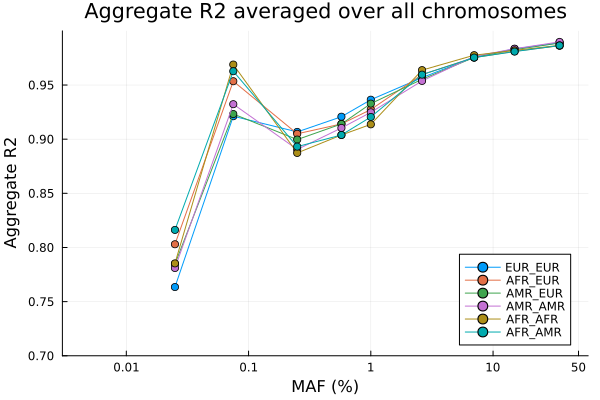

In [10]:
# no QC on imputed result
df = CSV.read("/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.ancestryR2", DataFrame)
plt = make_aggregate_R2_plots(
    [Vector{Float64}(df[!, i]) for i in 2:size(df, 2)],
    names(df)[2:end],
    [0.0, 0.0005, 0.00100, 0.00400, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5],
    "Aggregate R2 averaged over all chromosomes"
)

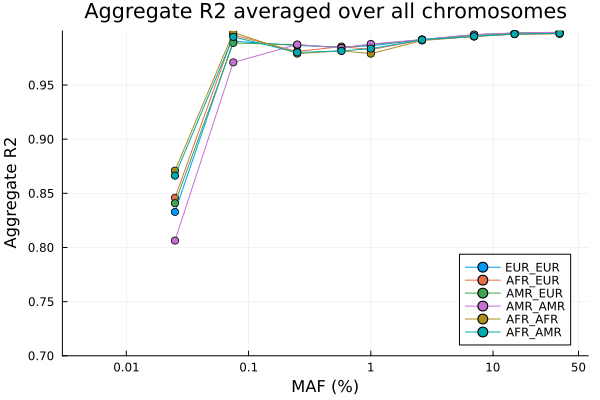

In [11]:
# performed QC on imputed result
df = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.ancestryR2", DataFrame)
plt = make_aggregate_R2_plots(
    [Vector{Float64}(df[!, i]) for i in 2:size(df, 2)],
    names(df)[2:end],
    [0.0, 0.0005, 0.00100, 0.00400, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5],
    "Aggregate R2 averaged over all chromosomes"
)

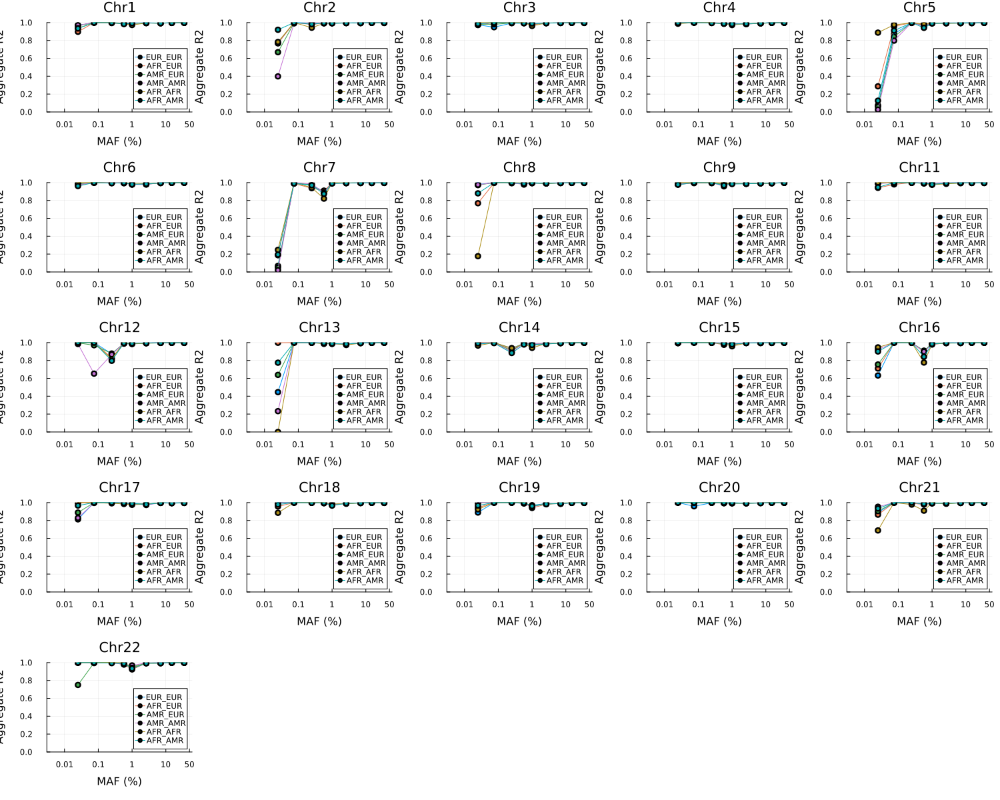

In [9]:
plts = []
for chr in 1:22
    chr == 10 && continue
    df = CSV.read("/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/chr$chr.ancestryR2", DataFrame)
    plt = make_aggregate_R2_plots(
        [Vector{Float64}(df[!, i]) for i in 2:size(df, 2)],
        names(df)[2:end],
        [0.0, 0.0005, 0.00100, 0.00400, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5],
        "Chr$chr"
    )
    push!(plts, plt)
end
plot(plts..., size=(1500, 1200), left_margin=2Plots.mm, bottom_margin=5Plots.mm)

## Concordance

In [2]:
for basic_QC in [true, false]
    # chromosome by chromosome
    for chr in 1:22
        genotype_file = basic_QC ? 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC/chr$chr.vcf.gz" : 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
        imputed_file = "/u/home/b/biona001/project-loes/paisa_tmp/genotype_dosages/chr$chr.vcf.gz"
        outfile = basic_QC ? 
            "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/chr$chr.basicQC.concordance" : 
            "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/chr$chr.concordance"
        cmd = "julia $concordance_exe --truth $genotype_file --impt $imputed_file --out $outfile"
        submit(cmd, 1, 12, jobname="chr$(chr)conc", waitfor=["lai_chr$chr"])
    end

    # also compute over all chromosomes
    genotype_files = String[]
    imputed_files = String[]
    for chr in 1:22
        genotype_file = basic_QC ? 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC/chr$chr.vcf.gz" : 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
        imputed_file = "/u/home/b/biona001/project-loes/paisa_tmp/genotype_dosages/chr$chr.vcf.gz"
        push!(genotype_files, genotype_file)
        push!(imputed_files, imputed_file)
    end
    outdir = "/u/home/b/biona001/project-loes/paisa_tmp/accuracy"
    input1 = joinpath(outdir, basic_QC ? "chr1to22_basic_array_files.txt" : "chr1to22_array_files.txt")
    input2 = joinpath(outdir, basic_QC ? "chr1to22_basic_imputed_files.txt" : "chr1to22_imputed_files.txt")
    writedlm(input1, genotype_files)
    writedlm(input2, imputed_files)
    outfile = joinpath(outdir, basic_QC ? "allchr.basicQC.concordance" : "allchr.concordance")
    cmd = "julia $concordance_exe --truth $input1 --impt $input2 --out $outfile"
    submit(cmd, 1, 12, jobname="chr1-22.conc", waitfor=["lai_chr$chr" for chr in 1:22])
end

Your job 897230 ("chr1conc") has been submitted
Your job 897231 ("chr2conc") has been submitted
Your job 897232 ("chr3conc") has been submitted
Your job 897233 ("chr4conc") has been submitted
Your job 897235 ("chr5conc") has been submitted
Your job 897236 ("chr6conc") has been submitted
Your job 897237 ("chr7conc") has been submitted
Your job 897238 ("chr8conc") has been submitted
Your job 897239 ("chr9conc") has been submitted
Your job 897240 ("chr10conc") has been submitted
Your job 897241 ("chr11conc") has been submitted
Your job 897242 ("chr12conc") has been submitted
Your job 897243 ("chr13conc") has been submitted
Your job 897244 ("chr14conc") has been submitted
Your job 897245 ("chr15conc") has been submitted
Your job 897246 ("chr16conc") has been submitted
Your job 897247 ("chr17conc") has been submitted
Your job 897248 ("chr18conc") has been submitted
Your job 897249 ("chr19conc") has been submitted
Your job 897250 ("chr20conc") has been submitted
Your job 897251 ("chr21conc")

In [3]:
for basic_QC in [true, false]
    # chromosome by chromosome
    for chr in 1:22
        genotype_file = basic_QC ? 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC/chr$chr.vcf.gz" : 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
        imputed_file = "/u/home/b/biona001/project-loes/paisa_qc_v1/genotype_dosages/chr$chr.vcf.gz"
        summary_file = "/u/home/b/biona001/project-loes/paisa_qc_v1/chr$chr.summary"
        outfile = basic_QC ? 
            "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/chr$chr.basicQC.concordance" : 
            "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/chr$chr.concordance"
        cmd = "julia $concordance_exe --truth $genotype_file --impt $imputed_file --out $outfile --summary $summary_file"
        submit(cmd, 1, 12, jobname="chr$(chr)conc", waitfor=["lai_chr$chr"])
    end

    # also compute over all chromosomes
    genotype_files = String[]
    imputed_files = String[]
    summary_files = String[]
    for chr in 1:22
        genotype_file = basic_QC ? 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC/chr$chr.vcf.gz" : 
            "/u/home/b/biona001/project-loes/ForBen_genotypes_subset/QC_conformed/chr$chr.vcf.gz"
        imputed_file = "/u/home/b/biona001/project-loes/paisa_qc_v1/genotype_dosages/chr$chr.vcf.gz"
        summary_file = "/u/home/b/biona001/project-loes/paisa_qc_v1/chr$chr.summary"
        push!(genotype_files, genotype_file)
        push!(imputed_files, imputed_file)
        push!(summary_files, summary_file)
    end
    outdir = "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy"
    input1 = joinpath(outdir, basic_QC ? "chr1to22_basic_array_files.txt" : "chr1to22_array_files.txt")
    input2 = joinpath(outdir, basic_QC ? "chr1to22_basic_imputed_files.txt" : "chr1to22_imputed_files.txt")
    summary_input = joinpath(outdir, basic_QC ? "chr1to22_basic_summary_files.txt" : "chr1to22_summary_files.txt")
    writedlm(input1, genotype_files)
    writedlm(input2, imputed_files)
    writedlm(summary_input, summary_files)
    outfile = joinpath(outdir, basic_QC ? "allchr.basicQC.concordance" : "allchr.concordance")
    cmd = "julia $concordance_exe --truth $input1 --impt $input2 --out $outfile --summary $summary_input"
    submit(cmd, 1, 12, jobname="chr1-22.conc", waitfor=["lai_chr$chr" for chr in 1:22])
end

Your job 897282 ("chr1conc") has been submitted
Your job 897283 ("chr2conc") has been submitted
Your job 897284 ("chr3conc") has been submitted
Your job 897285 ("chr4conc") has been submitted
Your job 897286 ("chr5conc") has been submitted
Your job 897287 ("chr6conc") has been submitted
Your job 897288 ("chr7conc") has been submitted
Your job 897289 ("chr8conc") has been submitted
Your job 897290 ("chr9conc") has been submitted
Your job 897291 ("chr10conc") has been submitted
Your job 897292 ("chr11conc") has been submitted
Your job 897293 ("chr12conc") has been submitted
Your job 897294 ("chr13conc") has been submitted
Your job 897295 ("chr14conc") has been submitted
Your job 897296 ("chr15conc") has been submitted
Your job 897297 ("chr16conc") has been submitted
Your job 897298 ("chr17conc") has been submitted
Your job 897299 ("chr18conc") has been submitted
Your job 897300 ("chr19conc") has been submitted
Your job 897301 ("chr20conc") has been submitted
Your job 897303 ("chr21conc")

### Non-reference concordance plot

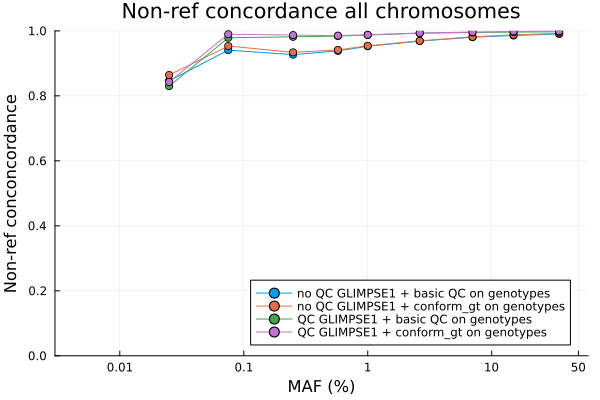

In [11]:
plt_labels = [
    "no QC GLIMPSE1 + basic QC on genotypes", 
    "no QC GLIMPSE1 + conform_gt on genotypes",
    "QC GLIMPSE1 + basic QC on genotypes", 
    "QC GLIMPSE1 + conform_gt on genotypes"
]
outfiles = [
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.concordance"
]

# concordance over all chromosomes
concordances = Vector{Float64}[]
mafs = Vector{Float64}[]
for outfile in outfiles
    df = CSV.read(outfile, DataFrame)
    push!(concordances, df[!, "nonref_concordance"])
    push!(mafs, df[!, "mafs"])
end

maf_bins = [0.0, 0.0005, 0.00100, 0.004, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5]
title = "Non-ref concordance all chromosomes"
concor_plt = make_concordance_plots(
    concordances, mafs, plt_labels, maf_bins, title
)

### Sensitivity plot

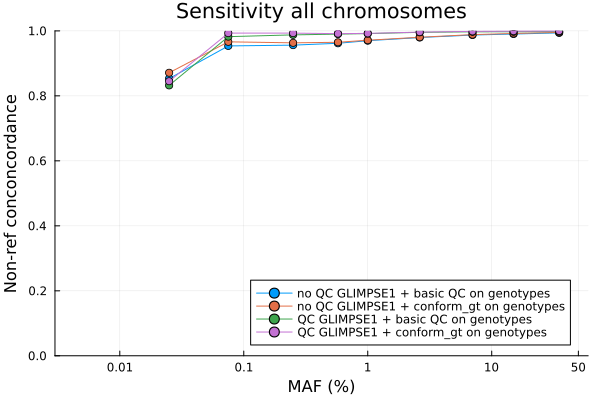

In [12]:
plt_labels = [
    "no QC GLIMPSE1 + basic QC on genotypes", 
    "no QC GLIMPSE1 + conform_gt on genotypes",
    "QC GLIMPSE1 + basic QC on genotypes", 
    "QC GLIMPSE1 + conform_gt on genotypes"
]
outfiles = [
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.concordance"
]

# concordance over all chromosomes
concordances = Vector{Float64}[]
mafs = Vector{Float64}[]
for outfile in outfiles
    df = CSV.read(outfile, DataFrame)
    push!(concordances, df[!, "sensitivity"])
    push!(mafs, df[!, "mafs"])
end

maf_bins = [0.0, 0.0005, 0.00100, 0.004, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5]
title = "Sensitivity all chromosomes"
sensitivity_plt = make_non_ref_concordance_plots(
    concordances, mafs, plt_labels, maf_bins, title
)

### Precision plot

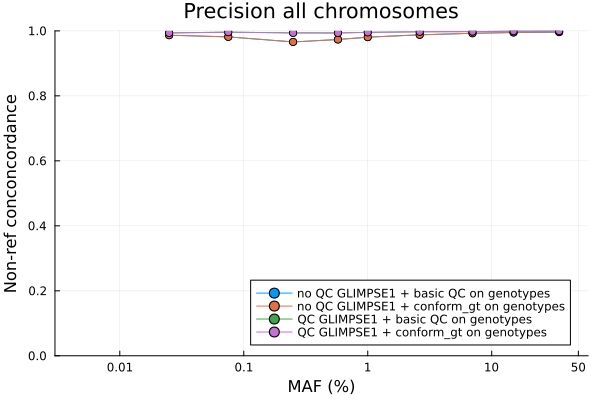

In [13]:
plt_labels = [
    "no QC GLIMPSE1 + basic QC on genotypes", 
    "no QC GLIMPSE1 + conform_gt on genotypes",
    "QC GLIMPSE1 + basic QC on genotypes", 
    "QC GLIMPSE1 + conform_gt on genotypes"
]
outfiles = [
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_tmp/accuracy/allchr.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.basicQC.concordance",
    "/u/home/b/biona001/project-loes/paisa_qc_v1/accuracy/allchr.concordance"
]

# concordance over all chromosomes
concordances = Vector{Float64}[]
mafs = Vector{Float64}[]
for outfile in outfiles
    df = CSV.read(outfile, DataFrame)
    push!(concordances, df[!, "precision"])
    push!(mafs, df[!, "mafs"])
end

maf_bins = [0.0, 0.0005, 0.00100, 0.004, 0.0075, 0.0125, 0.04, 0.1, 0.2, 0.5]
title = "Precision all chromosomes"
precision_plt = make_non_ref_concordance_plots(
    concordances, mafs, plt_labels, maf_bins, title
)

### Combined

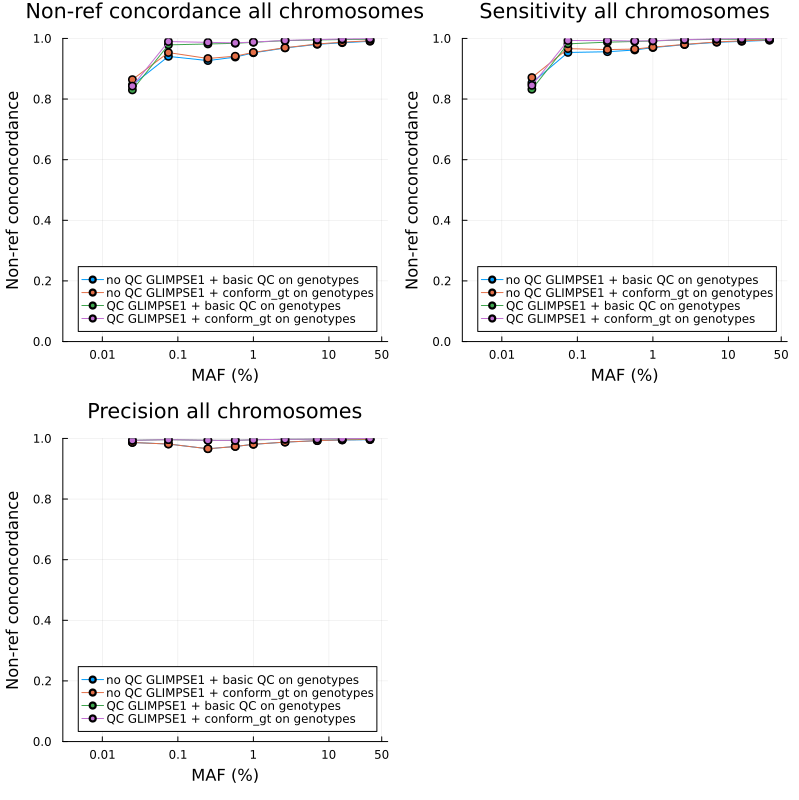

In [14]:
plot(concor_plt, sensitivity_plt, precision_plt, size=(800, 800))

In [15]:
outfile = outfiles[1]
df = CSV.read(outfile, DataFrame)

Row,mafs,sensitivity,precision,nonref_concordance
,Float64,Float64,Float64,Float64
1,0.0245365,0.830769,1.0,0.830769
2,0.0444654,0.978947,0.93,0.911765
3,0.0053847,1.0,0.428571,0.428571
4,0.00210947,1.0,1.0,1.0
5,0.0044965,1.0,0.6,0.6
6,0.0273121,1.0,1.0,1.0
7,0.106695,0.987711,0.991519,0.979436
8,0.262851,1.0,1.0,1.0
9,0.00999223,0.921053,0.945946,0.875
